### Imports

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib widget


In [2]:
# Computational packages
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import tqdm
#import cv2 as cv

# General packages
import datetime
import sys
import os

# custom packages
import ratsimulator
from ratsimulator.Environment import Rectangle
import spatial_maps as sm # CINPLA spatial maps

# avoid adding multiple relave paths to sys.path
sys.path.append("../../src") if "../../src" not in sys.path else None 
from PlaceCells import PlaceCells
from Models import SorscherRNN
from Experiment import Experiment
from methods import *
from datahandling import *
from stats import *
from astropy.convolution import Gaussian2DKernel, convolve

import umap
from sklearn.cluster import DBSCAN 
from sklearn.decomposition import PCA
import plotly.graph_objects as go
import plotly.offline as pyo

import matplotlib.cm
import matplotlib.colors

import scipy.stats
    
# Set notebook mode to work in offline
pyo.init_notebook_mode()

## First we need some utilities for loading the model, ratemaps, and scores

In [3]:
def load_model(path, name):
    # Load a model + experiment dependencies from path with name name
    experiment = Experiment(name = name, base_path=path)
    experiment.setup()
    # and parameters + other 
    params = experiment.params
    environments = experiment.environments
    agents = experiment.agents
    pc_ensembles = experiment.pc_ensembles
    loc = experiment.paths
    # load weights
    checkpoint_filenames = filenames(loc['checkpoints'])
    # load model latest (wrt. #epochs trained)
    print(f"Loading model at epoch = {checkpoint_filenames[-1]}", loc['checkpoints'] / checkpoint_filenames[-1])
    checkpoint = torch.load(loc['checkpoints'] / checkpoint_filenames[-1])
    
    # instantiate trained model this time
    model = SorscherRNN(pc_ensembles, Ng=params['Ng'], Np=params['Np'])
    model.load_state_dict(checkpoint['model_state_dict'])

    return model, params, environments, agents, pc_ensembles, experiment

def load_statistics(experiment):
    # load grid scores + ratemaps
    scores = []
    score_files = os.listdir(experiment.paths["grid_scores"])
    for fname in score_files:
        if not "novel" in fname:
            with open(f"{experiment.paths['grid_scores']}/{fname}", "rb") as f:
                print(f"{experiment.paths['grid_scores']}/{fname}")
                scores.append(pickle.load(f))
    scores = np.concatenate(scores)

    ratemaps = []
    kernel = Gaussian2DKernel(x_stddev=1)

    for env_i in range(len(environments)):
        with open(experiment.paths['ratemaps'] / f'env_{env_i}' / filenames(experiment.paths['ratemaps'] / f'env_{env_i}')[-1], "rb") as f:
            ratemaps.append(convolve(pickle.load(f), kernel.array[None]))
    ratemaps = np.concatenate(ratemaps)
    return ratemaps, scores

def env_split(stats, Ng=4096):
    # stack ratemaps by environment
    env_stat = []
    for env_i in range(len(environments)):
        tmp = stats[Ng*env_i:Ng*(env_i+1)]
        env_stat.append(tmp)
    return np.array(env_stat)

## Then some methods for computing statistics on the ratemaps

In [4]:
def find_orientations(maps):
    return np.array([list(map(lambda x: grid_orientation(x)[0], maps[i])) for i in range(len(maps))])

def find_spacings(maps):
     return np.array([list(map(lambda x: grid_spacing(x)[0], maps[i])) for i in range(len(maps))])

def hd_tuning(g, v):
    # g.shape = (n, ng)
    # v.shape = (n, 2)
    # theta.shape = nt
    theta = np.arctan2(v[:,1], v[:,0]) % (2*np.pi)
    theta_bins = np.linspace(0, 2*np.pi)
    hd_binned,_,_ = scipy.stats.binned_statistic(theta, g.T, bins = theta_bins)
    bins = theta_bins[:-1]
    tuning = np.abs(np.sum(hd_binned*np.exp(1j*bins[None]), axis = -1))/np.sum(hd_binned, axis = -1)
    return tuning
    

## And a convenient method for plotting 3D point clouds interactively using plotly

In [5]:
"""def plot_3d_proj(data, tags = None, cmap = None, title = ""):
    fig = go.Figure(data=[go.Scatter3d(
        x=data[:,0],
        y=data[:,1],
        z=data[:,2],
        mode='markers',
        marker=dict(
            size=5,
            color=tags,          
            colorbar=dict(title=title),
            colorscale=cmap,   # choose a colorscale
            opacity=0.4
        )
    )])
    # tight layout
    fig.update_scenes(xaxis_visible=False, yaxis_visible=False,zaxis_visible=False )
    fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
    
    fig.show()
    return fig"""

def plot_3d_proj(data, tags = None, cmap = "viridis", title = "", axes = None):
    if axes is None:
        fig = plt.figure()
        ax = fig.add_subplot(projection='3d')
    else:
        ax = axes
    ax.set_title(title)
    norm = matplotlib.colors.Normalize(np.amin(tags), np.amax(tags))
    col = matplotlib.cm.viridis(norm(tags))
    ax.scatter(xs=data[:,0], ys=data[:,1], zs=data[:,2], c = col, s = 15, alpha = 0.7, cmap = cmap)
    ax.axis("off")
    
    if axes is None:
        return fig

## And some tools for running the model: Useful for determining conjunctiveness.

In [6]:
def create_trajectories(dataset, environment_idx, num_trajectories=1500):
    """Generate trajectories to compute ratemaps with (scipy.stats.binned_statistics_2d)"""
    batch_velocities, batch_init_pc_positions, batch_positions = [], [], []
    for _ in range(num_trajectories):
        (velocities, init_pc_positions), _, positions, _ = dataset[environment_idx]
        batch_velocities.append(velocities)
        batch_init_pc_positions.append(init_pc_positions)
        batch_positions.append(positions)
    batch_inputs = [torch.stack(batch_velocities), torch.stack(batch_init_pc_positions)]
    batch_positions = torch.stack(batch_positions).detach().numpy()
    batch_velocities = torch.stack(batch_velocities).detach().numpy()
    return batch_inputs, batch_positions[:,1:], batch_velocities

def run_model(model, dataset, environments, samples = 1500, start = 0):
    # run model in inference mode on samples generated from dataset across environments.
    """
    model: SorscherRNN model
    dataset: dataset, passed to create_trajectories
    environments: environments class
    samples: number of trajectories to run model on
    start: start index of returned timeseries; used to skip initial states
    """
    
    activities = []
    env_tags = []
    r = [] # positions
    v = []

    for i in range(len(environments)):
        batch_inputs, batch_pos, batch_v = create_trajectories(dataset, i, num_trajectories = samples)
        g = model.g(batch_inputs).detach().cpu().numpy()[:,start:]
        g = g.reshape(-1, g.shape[-1])
        activities.append(g)
        r.append(np.reshape(batch_pos[:,start:], (-1, batch_pos.shape[-1])))
        v.append(np.reshape(batch_v[:,start:], (-1, batch_v.shape[-1])))
        env_tags.append(np.ones(len(g))*i)

    activities = np.stack(activities, axis=0)
    r = np.stack(r, axis=0)
    v = np.stack(v,axis=0)
    return activities, env_tags, r, v
    

In [7]:
def pca_UMAP(states):
    """ Run PCA followed by UMAP on states; Similar to Gardner et al. (2022)
    
    states.shape = (Nsamples, Nfeatures)
    PCA down to 6 features/principal components 
    UMAP of PCA componenents to 3 features.
    
    Note: Gardner et al. use n_neighbors = 5000 (more than number of samples in our case...)
    """
    pca_fit = PCA(n_components = 6).fit(states)
    pca_result = pca_fit.transform(states)
    umap_fit = umap.UMAP(n_components = 3, min_dist = 0.8,  # Almost Gardner et al. params
                         n_neighbors = 1000, metric = "cosine", init = "spectral")
    umap_result = umap_fit.fit_transform(pca_result)
    return pca_result, umap_result

## Fit PCA + UMAP to default model ratemaps

In [8]:
base_path = "/home/users/markusbp/"
model, params, environments, agents, pc_ensembles, experiment = load_model(base_path, "default")
ratemaps, scores = load_statistics(experiment)

Experiment <default> already EXISTS. Loading experiment settings!
Loading experiment details
This experiment has ALREADY been setup - SKIPPING.
Loading model at epoch = 0999 /home/users/markusbp/data/emergent-grid-cells/default/checkpoints/0999
/home/users/markusbp/data/emergent-grid-cells/default/grid_scores/0999_env_0.pkl


In [9]:
scores = env_split(scores)
ratemaps = env_split(ratemaps)
ratemaps = ratemaps
ratemaps.shape, scores.shape

((1, 4096, 64, 64), (1, 4096))

## First, we try to apply PCA followed by UMAP to all nonconjunctive cells with high grid score

In [10]:
# create dataset to determine what cells are conjunctive
dataset = Dataset(agents = agents, pc_ensembles = pc_ensembles, num_samples = 5000, **params)
acts, tags, r, v = run_model(model, dataset, environments, samples = 5000, start = 10)

# just env 0 for default
tuning = hd_tuning(acts[0], v[0])
not_conjunctive = tuning < 0.3

accepted = (scores[0] > 1.0)*(not_conjunctive)
print("No. accepted:", np.sum(accepted), accepted.shape)

g = ratemaps.reshape(ratemaps.shape[0],  ratemaps.shape[1], -1)

g = np.transpose(g, (0, 2, 1))

plot_g = g.reshape(-1, g.shape[-1])[:,accepted] # shape (n_samples, n_accepted)

No. accepted: 170 (4096,)


/tmp/ipykernel_3108946/282642324.py:15: RuntimeWarning:

invalid value encountered in true_divide



In [11]:
save_loc = "/home/users/markusbp/data/emergent-grid-cells/default/tori_analysis/"

In [12]:
pca_fit, u = pca_UMAP(plot_g)

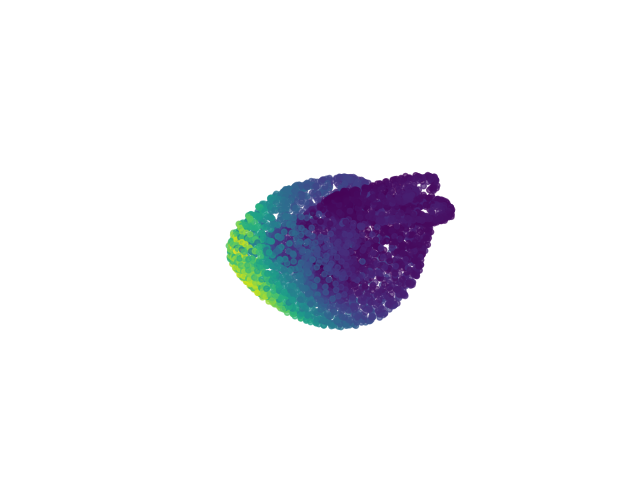

In [18]:
default_high_scorers = plot_3d_proj(u, pca_fit[:,0], cmap = "viridis")

In [21]:
#default_high_scorers.savefig(f"{save_loc}high_gridscore_c.svg")

# Cool! There is one rather strange torus.
## This might be due to UMAP/PCA not picking up on the fact that there might 
## be multiple modules present. We will therefore follow the procedure of Gardner et al.:
The basic steps are this:
- Make low-resolution ratemaps for all cells (15x15 bins)
- Compute an autocorrelogram for each cell
- Crop the autocorrelogram using an annulus mask
- Standardize each cropped autocorrelogram over space (subtract mean, divide by stddev)
- Stack standardized, cropped autocorrelograms into matrix of shape (Ncells, nbins)
- Compute 2D UMAP of this matrix
- Perform clustering using DBSCAN to identify clusters.
- The clusters should identify cells with similar autocorrelograms (similar grid orientation + spacing).


## First we define some methods for creating lower-res ratemaps and doing autocorrelations.

In [20]:
def autocorr(ratemaps, **kwargs):
    # compute autocorrelation of ratemap array, of shape (n_env, n_cells, px, py)
    img_size = (ratemaps.shape[-1]*2 - 1)
    corrs = np.zeros((ratemaps.shape[0], ratemaps.shape[1], img_size, img_size))
    
    for i in range(ratemaps.shape[0]):
        for j in range(ratemaps.shape[1]):
            corrs[i,j] = scipy.signal.correlate(ratemaps[i,j], ratemaps[i,j], **kwargs)
    return corrs

def annulus_mask(dims, inner_radius, outer_radius):
    center_x = int(dims[0]/2)
    center_y = int(dims[1]/2)
    
    x, y = np.ogrid[0:dims[0], 0:dims[1]]

    outer_mask = ((x - center_x) ** 2 + (y - center_y)** 2) <= (outer_radius**2)
    inner_mask = (x - center_x)**2 + (y-center_y)**2 >= (inner_radius**2)
    # larger than inner, smaller than outer is False
    return outer_mask*inner_mask

def create_ratemaps(g, r, res):
    return scipy.stats.binned_statistic_2d(r[:,0], r[:,1], g.T, bins=res)[0]


In [24]:
# create low-res ratemaps
# start from timestep 10 to get steady state/avoid "noise"
acts, tags, r, v = run_model(model, dataset, environments, samples = 5000, start = 10)
small_maps = create_ratemaps(acts[0], r[0], res = [15, 15])[None] # add extra dim to work with autocorr etc.

In [25]:
corrs = autocorr(small_maps)
corrs.shape

(1, 4096, 29, 29)

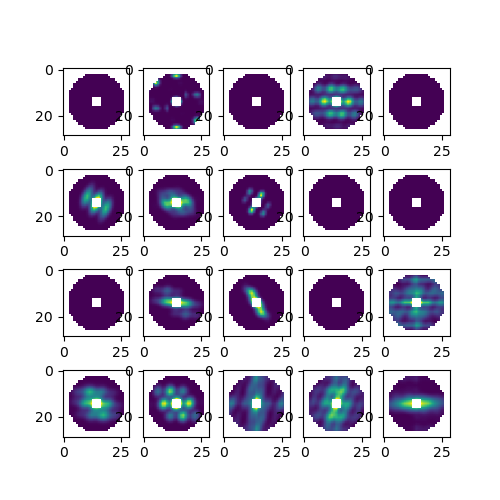

In [26]:
# Set the size of the correlation mask (in fractional pixels)
outer = int(corrs.shape[-1]/2*0.9) 
inner = int(corrs.shape[-1]/2*0.15)
mask = annulus_mask(corrs.shape[-2:], inner, outer)

# show a few examples; appears to exclude center peak as it should

fig, ax = plt.subplots(4, 5, figsize = [5, 5])
for i in range(20):
    ind = np.random.randint(corrs.shape[1])
    img = np.copy(corrs[0,ind])
    img[~mask] = np.nan
    row = i % 4
    col = i % 5
    ax[row, col].imshow(img)


In [8]:
def standardized_annuli(autocorr, mask):
    """ Crop autocorrelation ratemap using annulus mask and z-standardize.
    
    autocorr: autocorrelation ratemap
    mask: annulus mask
    """
    flat_mask = np.ravel(mask) # 1D annulus mask

    result = [] # save standardized annuli
    std_mask = [] # track cells with zero stddev on annulus

    for i in range(len(autocorr)):
        corr_annulus = np.zeros((autocorr.shape[1], np.sum(flat_mask)))
        for j in range(autocorr.shape[1]): # autocorr.shape[1] is cell dimension
            corr_annulus[j] = np.ravel(autocorr[i,j])[flat_mask]

        # z standardization
        annulus_std = np.std(corr_annulus, axis = -1) # std over space
        std_mask.append(annulus_std != 0) # track cells with zero variance
        nonzero = corr_annulus[annulus_std != 0] # remove zero-variance cells from result
        annulus_mean = np.mean(nonzero, axis = -1, keepdims = True)
        standardized = (nonzero - annulus_mean)/np.std(nonzero, axis = -1, keepdims = True)
        result.append(standardized)
    return result, std_mask



In [28]:
result, std_mask = standardized_annuli(corrs, mask)

In [9]:
def cluster_modules(autocorr_annuli):
    """ Grid module identification, following Gardner et al.
    
    Procedure is to convert z-standardized annuli of low-res. ratemaps to a matrix
    of shape (n_cells, n_bins), then do a 2D UMAP of this matrix.
    
    Clustering is then performed on the low-dimensional representation.
    Clustering uses DBSCAN.
    returns 
    """

    low_dim = []
    cluster_labels = []
    for i in range(len(autocorr_annuli)):
        transform = umap.UMAP(metric = "manhattan", n_neighbors = 5, min_dist = 0.05, init = "spectral")
        low_dim.append(transform.fit_transform(autocorr_annuli[i]))
        clustering = DBSCAN(min_samples = 30, eps = 0.5).fit(low_dim[-1])
        cluster_labels.append(clustering.labels_)
    return low_dim, cluster_labels



In [30]:
low_dim, cluster_labels = cluster_modules(result)

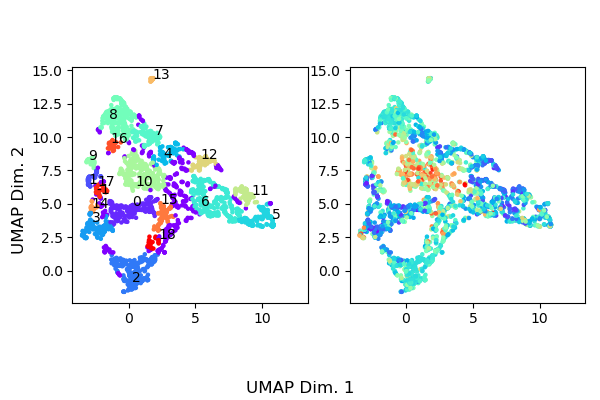

In [31]:
# Now we can plot the resulting clusters
for i in range(len(low_dim)):
    
    # color by cluster and score
    norm = matplotlib.colors.Normalize(np.amin(cluster_labels[i]), np.amax(cluster_labels[i]))
    cluster_color = matplotlib.cm.rainbow(norm(cluster_labels[i]))
    
    sc = scores[i][std_mask[i]] # remove cells with zero variance
    norm = matplotlib.colors.Normalize(np.amin(sc), np.amax(sc))
    score_color = matplotlib.cm.rainbow(norm(sc))
    
    fig, ax = plt.subplots(1, 2, figsize = (6, 4))
    
    ax[0].scatter(low_dim[i][:,0], low_dim[i][:,1], s = 5, c = cluster_color)
    ax[1].scatter(low_dim[i][:,0], low_dim[i][:,1], s = 5, c = score_color)
    for label in np.unique(cluster_labels[i]):
        ind = np.argwhere(cluster_labels[i]==label)[0,0]
        ax[0].text(low_dim[i][ind,0], low_dim[i][ind,1], str(cluster_labels[i][ind]))
    
    [ax[i].axis("square") for i in range(2)]
    fig.supxlabel("UMAP Dim. 1")
    fig.supylabel("UMAP Dim. 2")
    plt.tight_layout()
    plt.savefig(f"{save_loc}autocorrelation_clustering.svg")
    plt.show()
    

In [32]:
# And fit PCA + UMAP  to each cluster to see if they are actually toroidal
pca_fits = []
umap_fits = []
labels = [] # track labels; not all clusters have sufficient no. cells to do PCA + UMAP

for ind in np.unique(cluster_labels[0]):
    selected = cluster_labels[0] == ind
    if selected.sum() > 6:
        pca_fit, u = pca_UMAP(g[0][:,std_mask[0]][:,selected])
        
        pca_fits.append(pca_fit)
        umap_fits.append(u)
        labels.append(ind)
            
        

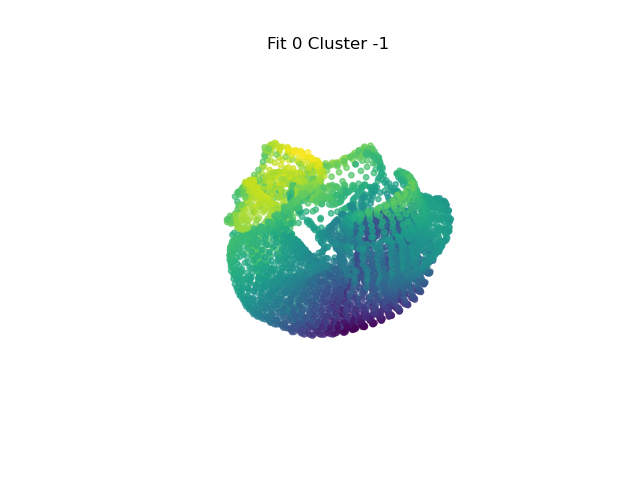

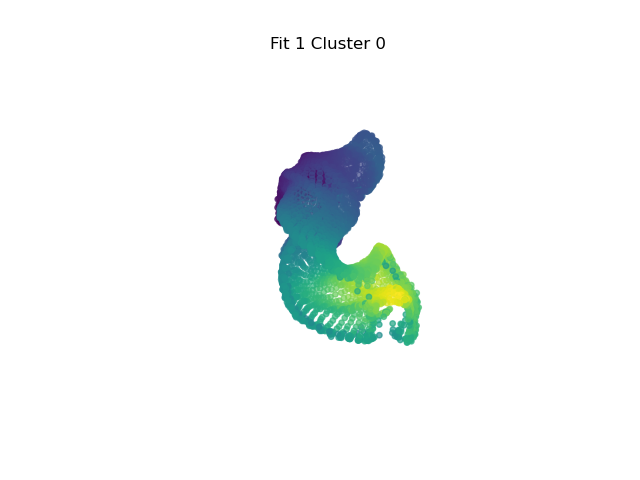

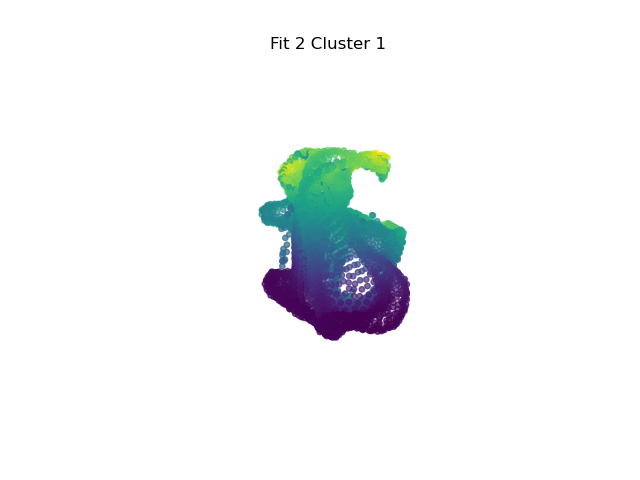

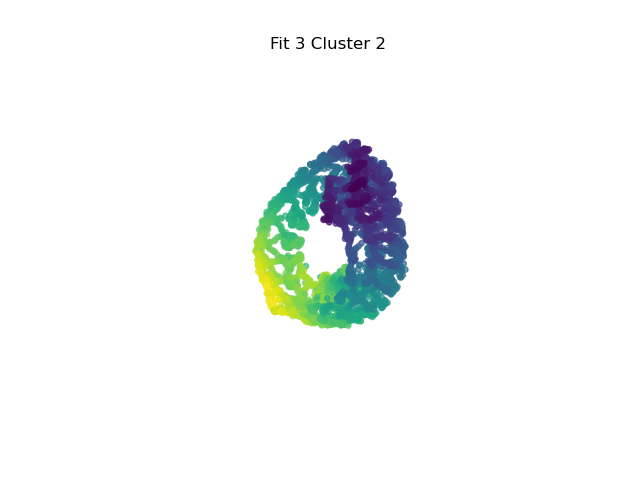

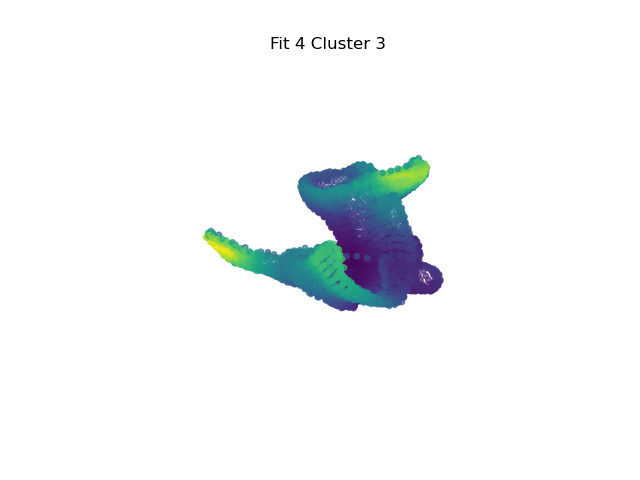

...

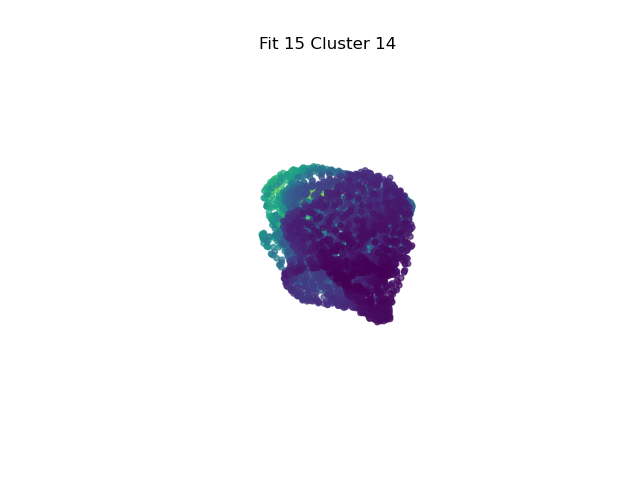

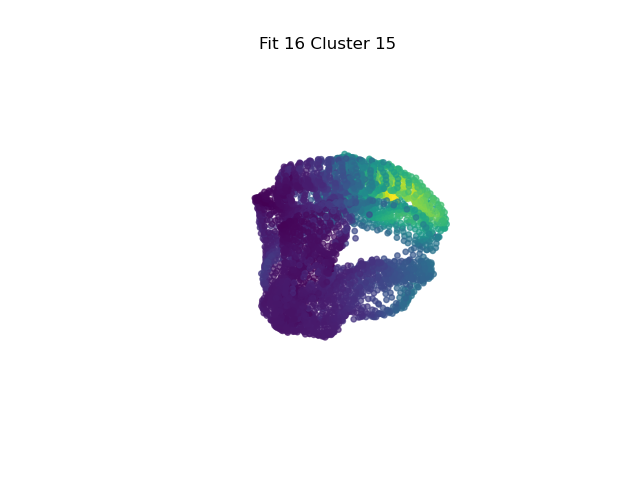

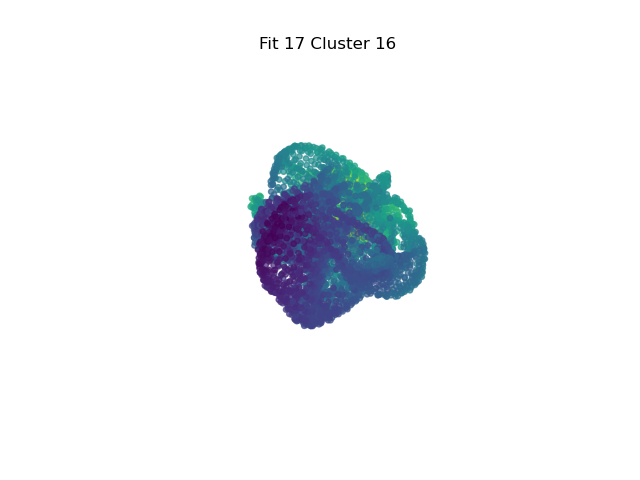

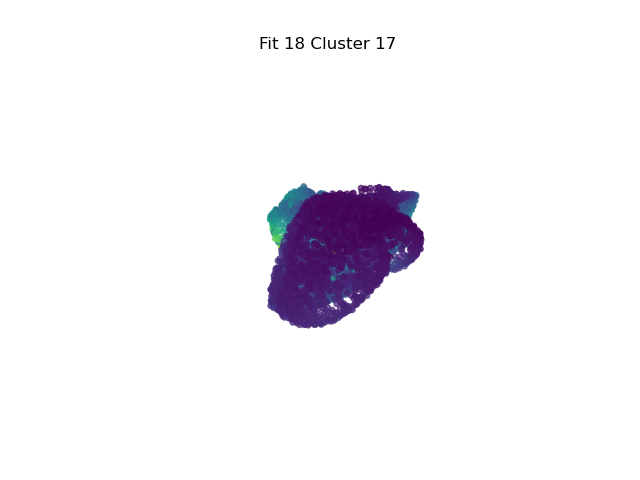

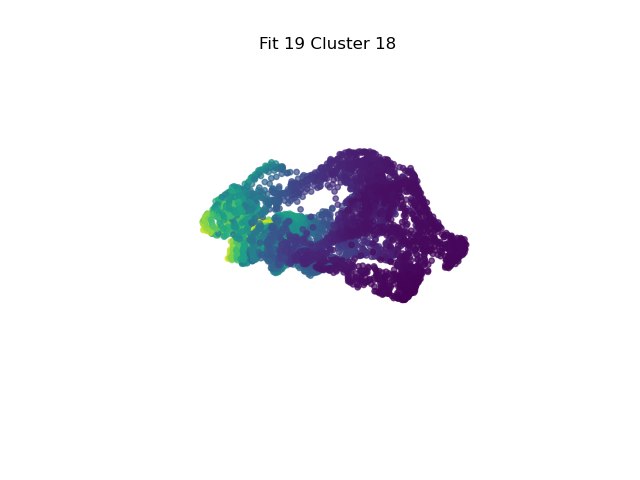

In [38]:
# plot the result
for i, (u, pc, label) in enumerate(zip(umap_fits, pca_fits, labels)):
    fig = plot_3d_proj(u, pc[:,0], title = f"Fit {i} Cluster {label}")

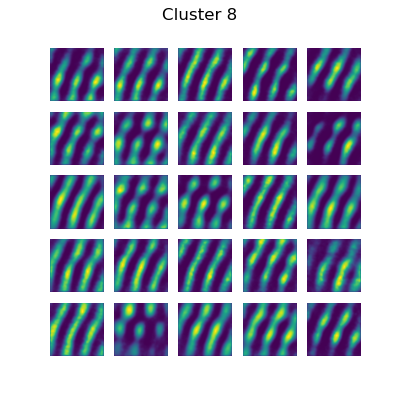

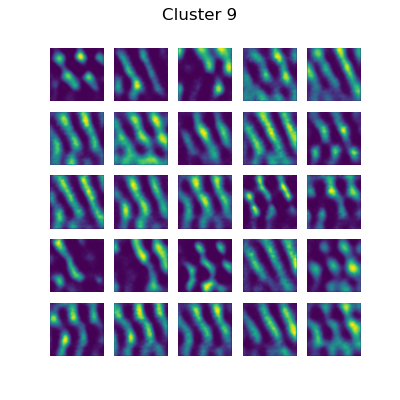

In [43]:
interesting_clusters = [8, 9]
fit_ind = [9, 10]

for ind in interesting_clusters:
    mask = ind == cluster_labels[0]

    show_maps = ratemaps[0, std_mask[0]][mask]
    fig, ax = plt.subplots(5, 5, figsize = (4,4))
    fig.suptitle(f"Cluster {ind}")
    for i in range(25):
        
        row = i // 5
        col = i % 5
        ax[row, col].imshow(show_maps[i])
        ax[row, col].axis("off")
    
    plt.savefig(f"{save_loc}example_ratemaps_cluster_{ind}.svg")
    plt.show()
        



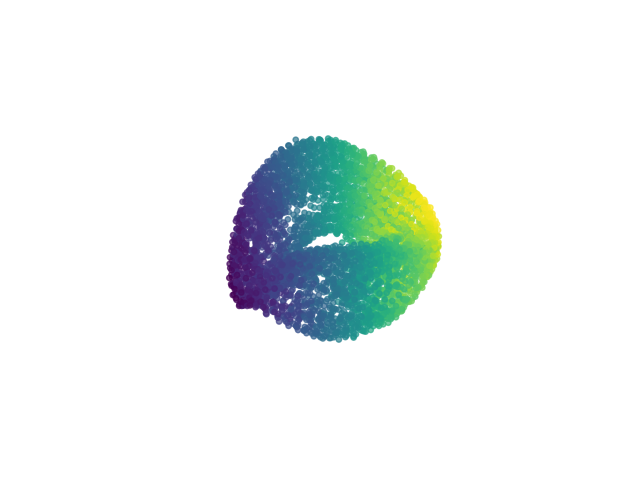

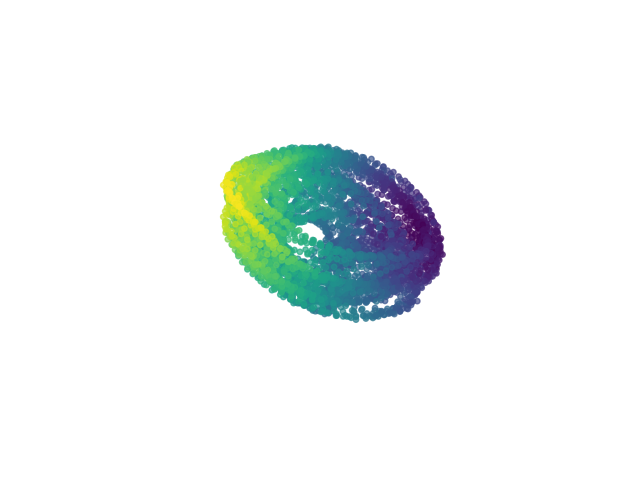

In [44]:
figs = []
for ind in fit_ind:
    figs.append(plot_3d_proj(umap_fits[ind], pca_fits[ind][:,0]))

In [51]:
#figs[0].savefig(f"{save_loc}cluster{interesting_clusters[0]}_d.svg")

In [49]:
#figs[1].savefig(f"{save_loc}cluster{interesting_clusters[1]}_c.svg")

## Dimensionality reduction for 3ME

In [10]:
base_path = "/home/users/markusbp/"
model, params, environments, agents, pc_ensembles, experiment = load_model(base_path, "3ME")
ratemaps, scores = load_statistics(experiment)

Experiment <3ME> already EXISTS. Loading experiment settings!
Loading experiment details
This experiment has ALREADY been setup - SKIPPING.
Loading model at epoch = 2990 /home/users/markusbp/data/emergent-grid-cells/3ME/checkpoints/2990
/home/users/markusbp/data/emergent-grid-cells/3ME/grid_scores/2990_env_0.pkl
/home/users/markusbp/data/emergent-grid-cells/3ME/grid_scores/2990_env_2.pkl
/home/users/markusbp/data/emergent-grid-cells/3ME/grid_scores/2990_env_1.pkl


In [11]:
scores = env_split(scores)
ratemaps = env_split(ratemaps)
ratemaps.shape, scores.shape

((3, 4096, 50, 50), (3, 4096))

In [12]:
dataset = Dataset(agents = agents, pc_ensembles = pc_ensembles, num_samples = 5000, **params)
acts, tags, r, v = run_model(model, dataset, environments, samples = 5000, start = 10)

tuning = hd_tuning(acts[0], v[0])
not_conjunctive = tuning < 0.3

# just use env 0
accepted = (scores[0] > 1.0)*(not_conjunctive)
print("No. accepted:", np.sum(accepted), accepted.shape)

g = ratemaps.reshape(ratemaps.shape[0],  ratemaps.shape[1], -1) # [nenvs, ncells, binx, biny] --> (nenvs, ncells, binx*biny)

g = np.transpose(g, (0, 2, 1)) # (nenvs, binx*biny, ncells)

plot_g = g.reshape(-1, g.shape[-1])[:,accepted] # shape (n_samples, n_accepted)

No. accepted: 80 (4096,)


/tmp/ipykernel_3139106/282642324.py:15: RuntimeWarning:

invalid value encountered in true_divide



In [13]:
save_loc = "/home/users/markusbp/data/emergent-grid-cells/3ME/tori_analysis/"

In [14]:
pca_fit, u = pca_UMAP(plot_g)

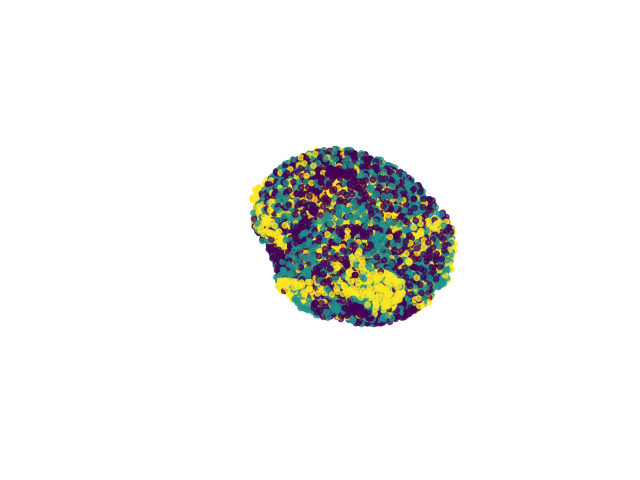

In [15]:
col = np.arange(len(u))//(len(u)/len(environments))
all_envs_high_score_fig = plot_3d_proj(u,tags = col, cmap = "viridis")


In [16]:
all_envs_high_score_fig.savefig(f"{save_loc}all_envs_high_score.svg")

In [17]:
orientations = find_orientations(ratemaps)
spacings = find_spacings(ratemaps)

In [18]:
n = 5000
acts, tags, r, v = run_model(model, dataset, environments, samples = n, start = 10)
r.shape, acts.shape

((3, 50000, 2), (3, 50000, 4096))

In [21]:
small_maps = []
for i in range(len(environments)):
    small_maps.append(create_ratemaps(acts[i], r[i], res = [15, 15])) # add extra dim to work with autocorr etc.
small_maps = np.array(small_maps)
small_maps.shape

(3, 4096, 15, 15)

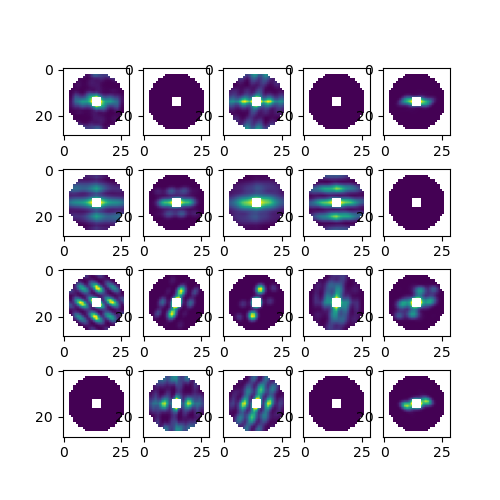

In [22]:
corrs = autocorr(small_maps)

outer = int(corrs.shape[-1]/2*0.9) 
inner = int(corrs.shape[-1]/2*0.15)
mask = annulus_mask(corrs.shape[-2:], inner, outer)

# show a few examples; appears to exclude center peak as it should

fig, ax = plt.subplots(4, 5, figsize = [5, 5])
for i in range(20):
    ind = np.random.randint(corrs.shape[1])
    img = np.copy(corrs[0,ind])
    img[~mask] = np.nan
    row = i % 4
    col = i % 5
    ax[row, col].imshow(img)

result, std_mask = standardized_annuli(corrs, mask)

In [23]:
low_dims, cluster_labels = cluster_modules(result)

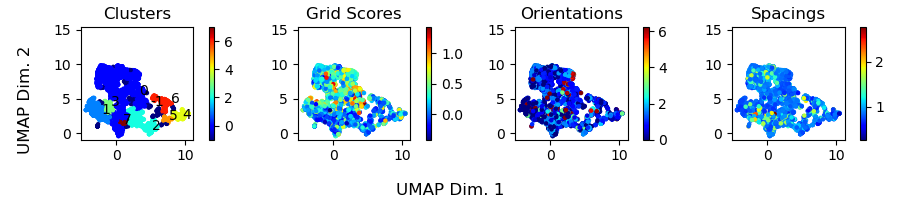

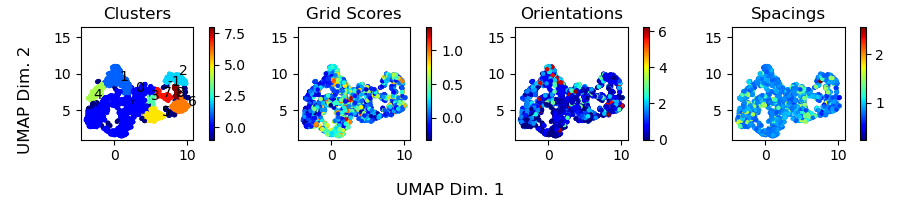

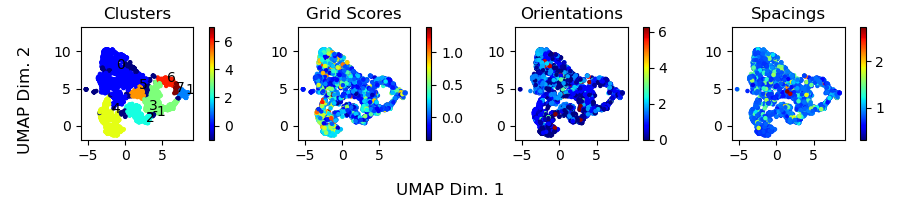

In [87]:
# Now we can plot the resulting clusters
for i in range(len(environments)):
    stats = [scores[i][std_mask[i]], orientations[i][std_mask[i]], spacings[i][std_mask[i]]]
    stat_names = ["Grid Scores", "Orientations", "Spacings"]
    

    fig, ax = plt.subplots(1, len(stats)+1, figsize = (3*len(stats), 2))
    cmap = "jet"

    norm = matplotlib.colors.Normalize(np.amin(cluster_labels[i]), np.amax(cluster_labels[i]))
    cluster_color = plt.get_cmap(cmap)(norm(cluster_labels[i]))
    
    ax[0].scatter(low_dims[i][:,0], low_dims[i][:,1], s = 5, c = cluster_color, cmap = cmap)
    fig.colorbar(matplotlib.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax[0], fraction = 0.045)

    for j in range(len(stats)):
        
        not_nan = ~np.isnan(stats[j])
        norm = matplotlib.colors.Normalize(np.amin(stats[j][not_nan]), np.amax(stats[j][not_nan]))
        color = plt.get_cmap(cmap)(norm(stats[j][not_nan]))
        ax[j+1].set_title(stat_names[j])
        ax[j+1].scatter(low_dims[i][not_nan,0], low_dims[i][not_nan,1], s = 5, c = color, cmap = cmap)
        fig.colorbar(matplotlib.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax[j+1], orientation = "vertical", fraction = 0.045)
    
    ax[0].set_title("Clusters")
    for label in np.unique(cluster_labels[i]):
        ind = np.argwhere(cluster_labels[i]==label)[0,0]
        ax[0].text(low_dims[i][ind,0], low_dims[i][ind,1], str(cluster_labels[i][ind]))
    
    [ax[i].axis("square") for i in range(len(ax))]
    fig.supxlabel("UMAP Dim. 1")
    fig.supylabel("UMAP Dim. 2")
    plt.tight_layout()
    plt.savefig(f"{save_loc}clustering_env{i}.svg")

In [25]:
# And fit PCA + UMAP  to each cluster to see if they are actually toroidal
pca_fits = []
umap_fits = []
labels = []

for i in range(len(environments)):
    env_pca = []
    env_umap = []
    env_labels = []

    for ind in np.unique(cluster_labels[i]):
        selected = cluster_labels[i] == ind
        
        if selected.sum() > 6:
            pca_fit, u = pca_UMAP(g[i][:,std_mask[i]][:,selected])
            env_pca.append(pca_fit)
            env_umap.append(u)
            env_labels.append(ind)
            
    pca_fits.append(env_pca)
    umap_fits.append(env_umap)
    labels.append(env_labels)

/tmp/ipykernel_3139106/534657615.py:24: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



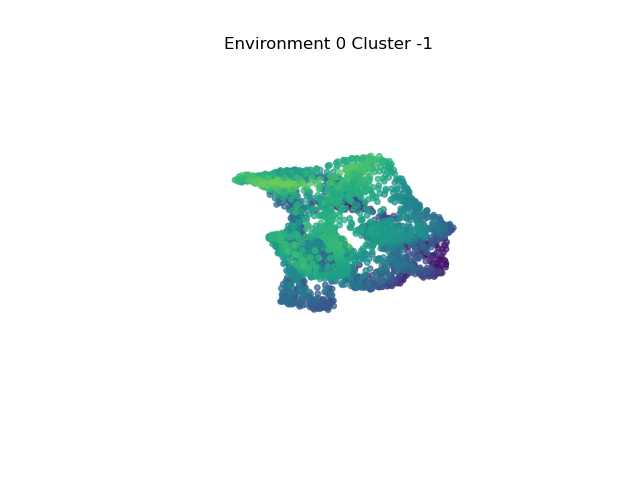

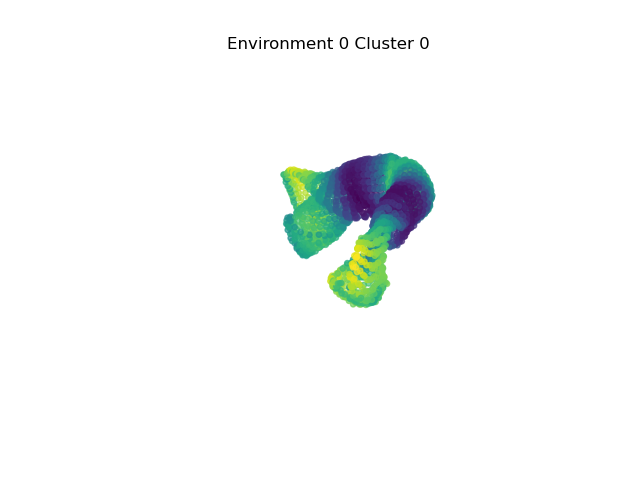

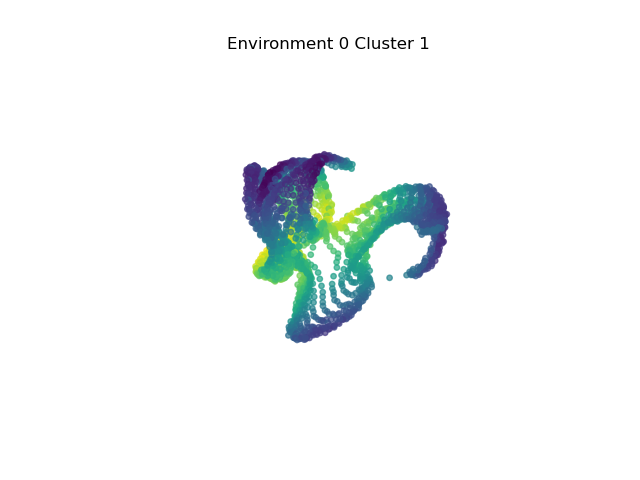

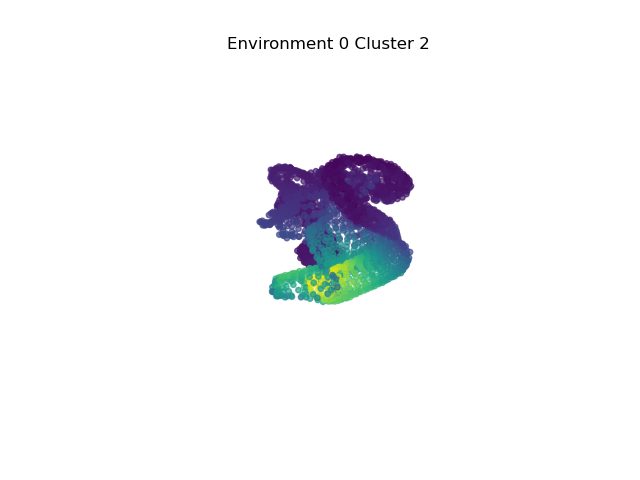

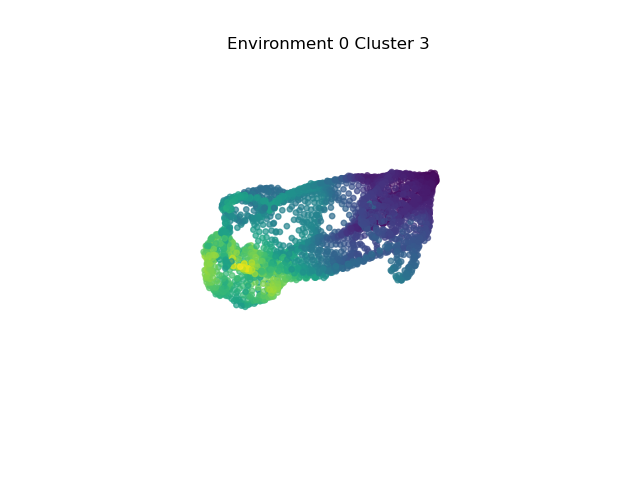

...

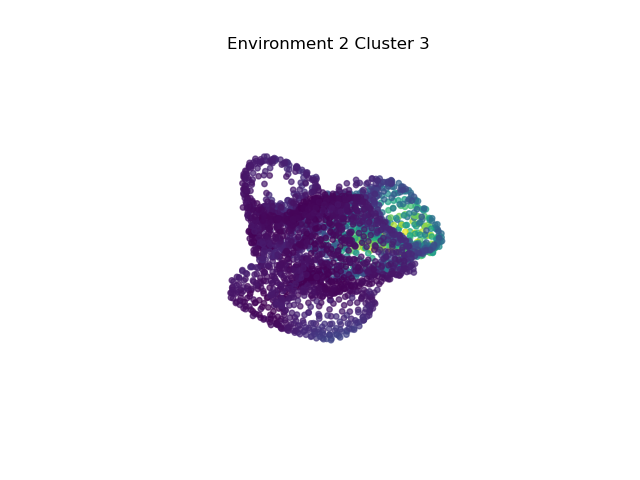

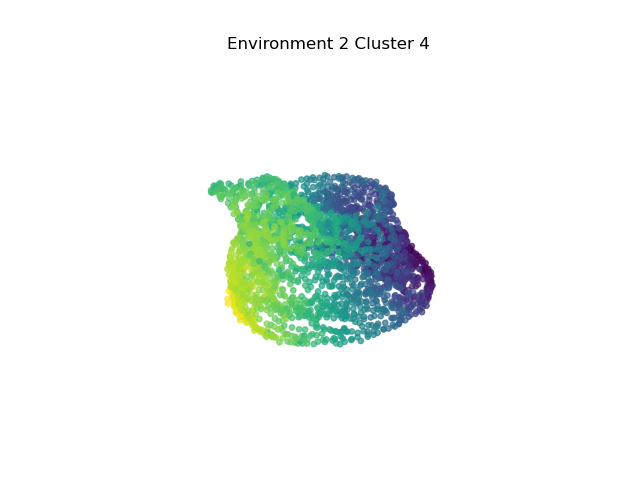

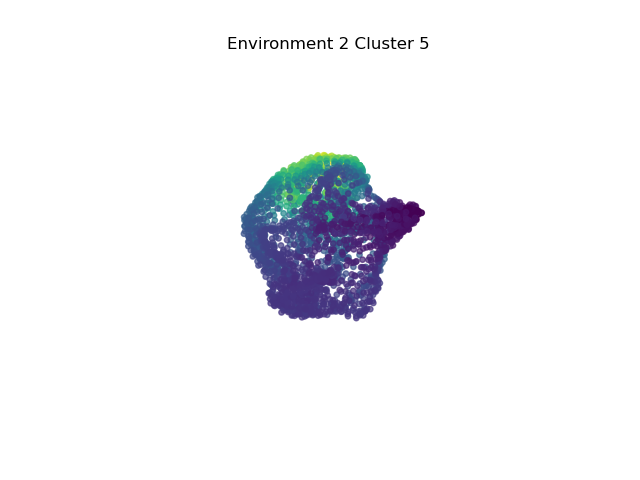

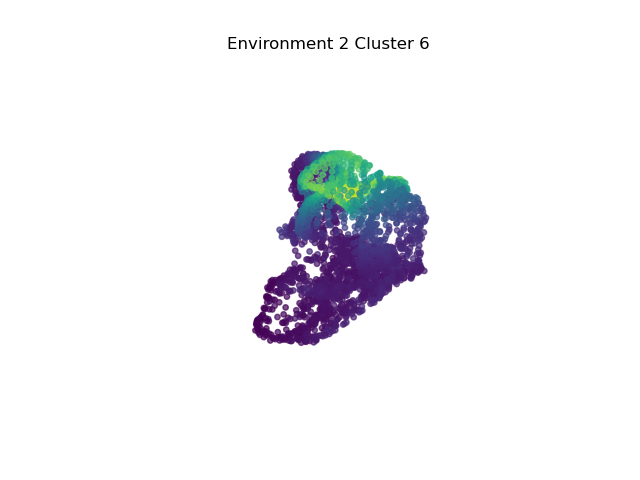

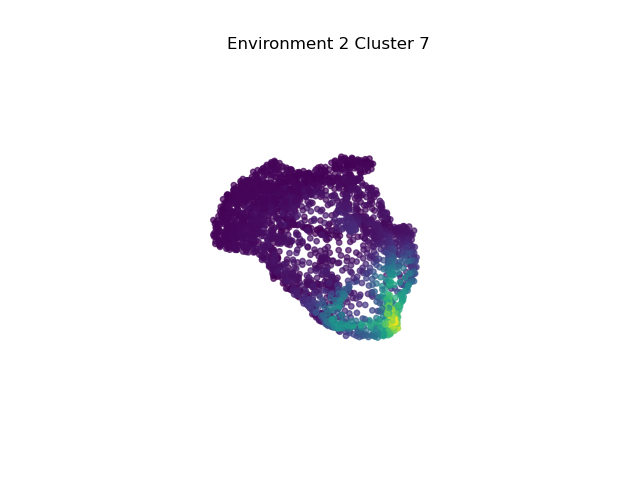

In [26]:
for i in range(len(environments)):
    for u, pc, label in zip(umap_fits[i], pca_fits[i], labels[i]):
        fig = plot_3d_proj(u, pc[:,0], title = f"Environment {i} Cluster {label}")        
    

In [27]:
interesting_clusters = [[], [1], [4] ] # identify interesting clusters in each env

In [71]:
"""
1. Run through each environments
2. Run through each interesting cluster index
3. Identify cells that are implicated in the cluster
4. Perform PCA + UMAP in each environment
5. Plot result

# Note; need to cut out non-stddev cells for each cluster
"""

fig_titles = []
pca_fits = []
umap_fits = []


for i in range(len(environments)):

    cluster_ind = interesting_clusters[i]
    for j in cluster_ind:
        cell_mask =  cluster_labels[i] == j
        
        #fig = plt.figure(figsize = (8,4))
        fig.supxlabel(f"No. Cells:{cell_mask.sum()}")
        
        env_pca_fits = []
        env_umap_fits = []
        env_titles = []
        
        for k in range(len(environments)):
            #ax = fig.add_subplot(1, 3, k+1, projection = "3d")
            pca_fit2, u2 = pca_UMAP(g[k][:,std_mask[i]][:,cell_mask])
            
            title = f"C{j}_from_env{i}_in_env{k}"
            env_titles.append(title)
            env_pca_fits.append(pca_fit2)
            env_umap_fits.append(u2)
            
            #plot_3d_proj(u2, pca_fit2[:,0], title = title, ax = ax)
        #plt.show()
        
        fig_titles.append(env_titles)
        pca_fits.append(env_pca_fits)
        umap_fits.append(env_umap_fits)

C1_from_env1_in_env0 C1_from_env1_in_env1 C1_from_env1_in_env2
C4_from_env2_in_env0 C4_from_env2_in_env1 C4_from_env2_in_env2


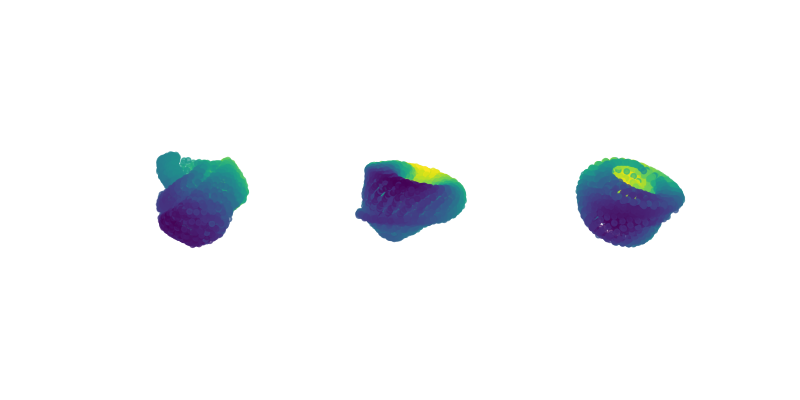

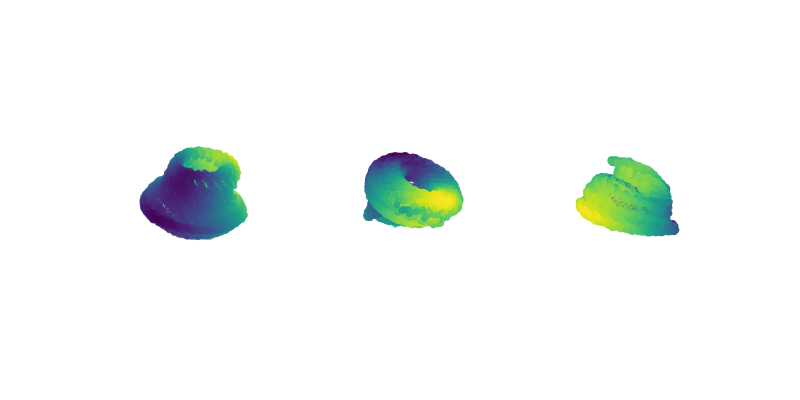

In [72]:
env_figs = []

for u, pc, title in zip(umap_fits, pca_fits, fig_titles):
    fig = plt.figure(figsize = (8,4))
    print(*title)
    for i in range(len(environments)):
        ax = fig.add_subplot(1, 3, i+1, projection = "3d")
        plot_3d_proj(u[i], pc[i][:,0], axes = ax)
    env_figs.append(fig)

In [84]:
name = " ".join(fig_titles[0])
env_figs[0].savefig(f"{save_loc}{name}_d.svg")

In [86]:
name = " ".join(fig_titles[1])
env_figs[1].savefig(f"{save_loc}{name}_d.svg")

## Finally, we save the different indices required to select the cells that set up the above tori

In [122]:
cell_inds = []
descriptions = []
for i, ind in enumerate(interesting_clusters):
    cluster_inds = interesting_clusters[i]
    for j in cluster_inds:
        selected = cluster_labels[i] == j
        mask = std_mask[i]
        # pick out indices that have nonzero stddev AND belong to an interesting cluster
        cell_inds.append(np.nonzero(std_mask[i])[0][selected])
        descriptions.append(f"C{j}_from_env_{i}")
        

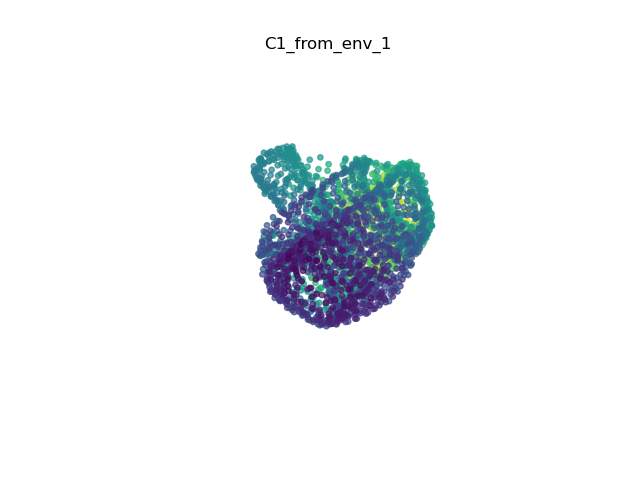

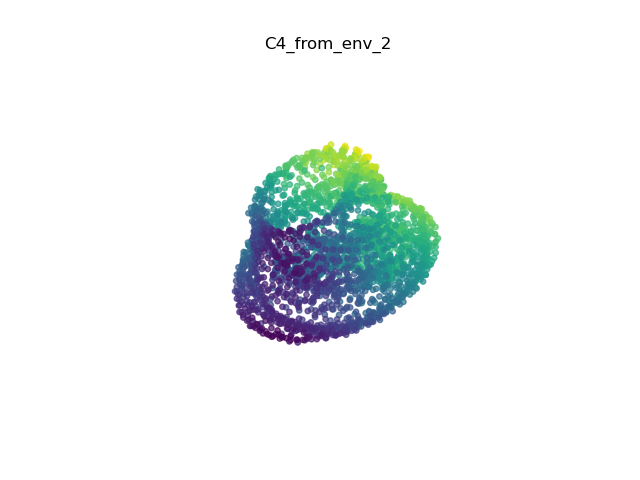

In [126]:
for i, inds in enumerate(cell_inds):
    ggg = g[0, :, inds]
    pcc, uu = pca_UMAP(ggg.T)
    plot_3d_proj(uu, pcc[:,0], title = descriptions[i])

In [150]:
# And save for posterity
x = {descriptions[i]: cell_inds[i] for i in range(len(descriptions))}
np.savez(f"{save_loc}module_indices", **x)

In [151]:
y = np.load(f"{save_loc}module_indices.npz", )

{'_files': ['C1_from_env_1.npy', 'C4_from_env_2.npy'], 'files': ['C1_from_env_1', 'C4_from_env_2'], 'allow_pickle': False, 'pickle_kwargs': {'encoding': 'ASCII', 'fix_imports': True}, 'zip': <zipfile.ZipFile file=<_io.BufferedReader name='/home/users/markusbp/data/emergent-grid-cells/3ME/tori_analysis/module_indices.npz'> mode='r'>, 'f': <numpy.lib.npyio.BagObj object at 0x7f97b987cfa0>, 'fid': <_io.BufferedReader name='/home/users/markusbp/data/emergent-grid-cells/3ME/tori_analysis/module_indices.npz'>}


In [ ]:
# Check that all is well
for i, inds in enumerate(cell_inds):
    ggg = g[0, :, inds]
    pcc, uu = pca_UMAP(ggg.T)
    plot_3d_proj(uu, pcc[:,0], title = descriptions[i])

In [188]:
# check for intersecting indices
xx = []
for i in y:
    xx.append(list(y[i]))

In [190]:
intersect = list(set(xx[0]) & set(xx[1]))
print("Number of intersecting elements/ number of elements in each cluster:", len(intersect), "/", 
        [len(x) for x in xx])

Number of intersecting elements/ number of elements in each cluster: 29 / [447, 560]


In [183]:
# remove intersect
for i in range(len(xx)):
    for j in range(len(intersect)):
        xx[i].remove(intersect[j])

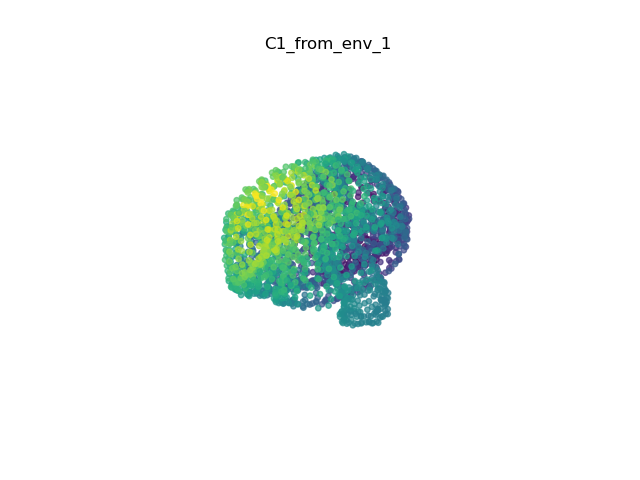

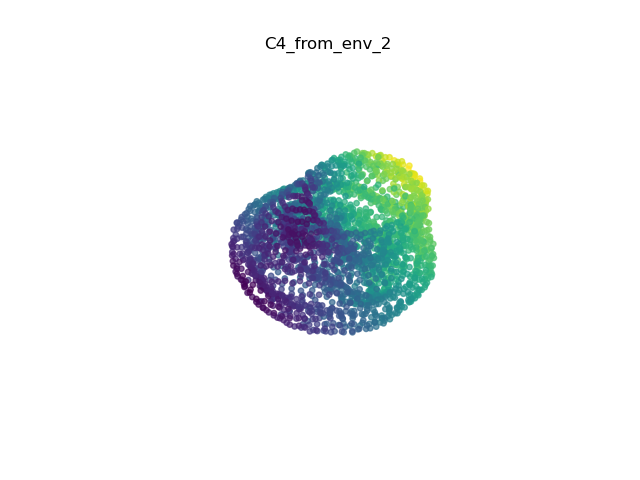

In [186]:
# recheck that all is well.
for i, inds in enumerate(xx):
    ggg = g[0, :, inds]
    pcc, uu = pca_UMAP(ggg.T)
    plot_3d_proj(uu, pcc[:,0], title = descriptions[i])